# DATS 6103 - INDIVIDUAL PROJECT 3 - ARUSHI KAPOOR

## TOPIC

### The purpose of this project is to explore the stock data of six major companies, Facebook, Amazon, Apple, Microsoft, Google and Tesla, also known as FAAMGT, since 2000. The project attempts to explore the following for the given stocks - 

#### 1. Trends in Adjusted Closing Prices, Moving Averages and Daily Returns

#### 2. Correlations among Daily Returns

#### 3. Risk Analysis

#### 4. Future Predictions 

### The project also explores the underlying reasons behind a company's stock performance and how does the same affect an investor's decision. 

## SOURCE OF THE DATA

### The data was obtained from Yahoo Finance via pandas datareader. 
https://finance.yahoo.com/

### The dataset  has also been saved in a csv format for ease in reading purposes if the same cannot be accessed directly via pandas datareader. 

## DATA READING, CLEANING & PRE-PROCESSING

The data for each of the companies was read directly from Yahoo Finance using pandas datareader. 

In [1]:
pip install pandas_datareader

Note: you may need to restart the kernel to use updated packages.


In [2]:
# Reading the datasets using the given libraries 
import pandas as pd
import pandas_datareader as pdr
import datetime

# Setting the start date as 1 January 2000 and end date as 8 December 2020
startdate = datetime.datetime(2000, 1, 1)
enddate = datetime.datetime(2020, 12, 8)

#### 1. Retrieving Adjusted Closing Prices 

For ease in analysis, a long dataframe was created that stored just the adjusted closing prices of each of the stock tickers. The dataframe was named as ac_price. This dataframe consists of approximately 31000 datapoints. 

In [3]:
# Creating a list of stock tickers
stocks = ['FB', 'AMZN', 'AAPL', 'MSFT', 'GOOG', 'TSLA']

# Storing the adjusted closed price data of all the stock tickers into the given dataframe
ac_price = pdr.get_data_yahoo(stocks, startdate, enddate)['Adj Close']

In [4]:
ac_price.head()

Symbols,FB,AMZN,AAPL,MSFT,GOOG,TSLA
Date,,,,,,
2000-01-03,NaN,89.3750,0.855168,37.102634,NaN,NaN
2000-01-04,NaN,81.9375,0.783068,35.849308,NaN,NaN
2000-01-05,NaN,69.7500,0.794528,36.227283,NaN,NaN
2000-01-06,NaN,65.5625,0.725771,35.013741,NaN,NaN
2000-01-07,NaN,69.5625,0.760149,35.471302,NaN,NaN


In [5]:
# Reading the data froma csv file if the above doesn't work 
# ac_price = pd.read_csv("ac_price.csv").set_index("Date")
# ac_price.head()

#### 2. Calculating Daily Returns

For analysis, a long dataframe was created that stored the daily returns derived from the adjusted closing prices of each of the stock tickers. The dataframe was named as daily_return. 

In [6]:
# Calculating daily returns for each stock ticker and storing in a new dataframe 

daily_return = ac_price.pct_change()
daily_return.head()

Symbols,FB,AMZN,AAPL,MSFT,GOOG,TSLA
Date,,,,,,
2000-01-03,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-04,NaN,-0.083217,-0.084310,-0.033780,NaN,NaN
2000-01-05,NaN,-0.148741,0.014634,0.010543,NaN,NaN
2000-01-06,NaN,-0.060036,-0.086538,-0.033498,NaN,NaN
2000-01-07,NaN,0.061010,0.047369,0.013068,NaN,NaN


## DATA VISUALIZATION 

In [7]:
# Importing the required libraries 

import plotly
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.tools as tls
import plotly.express as px
import plotly.figure_factory as ff
from chart_studio.plotly import iplot
from plotly.offline import iplot
from plotly.offline import init_notebook_mode
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [8]:
py.sign_in('arushik1994', 'jD7AopX1C1xMEwC6gEBH')

### 3.1 Adjusted Closing Price Trends 

In [9]:
# Creating subplots to compare the adjusted closing prices of each stock ticker
# Each stock ticker has been assigned a unique color line and width

fig = make_subplots(rows=3, cols=2)

fig.add_trace(go.Scatter(x=ac_price.index, y=ac_price['FB'], name="Facebook", line=dict(color='darkblue', width=1.5)), row=1, col=1)

fig.add_trace(go.Scatter(x=ac_price.index, y=ac_price['AAPL'], name="Apple", line=dict(color='grey', width=1.5)), row=1, col=2)

fig.add_trace(go.Scatter(x=ac_price.index, y=ac_price['AMZN'], name="Amazon", line=dict(color='green', width=1.5)), row=2, col=1)

fig.add_trace(go.Scatter(x=ac_price.index, y=ac_price['MSFT'], name="Microsoft", line=dict(color='goldenrod', width=1.5)), row=2, col=2)

fig.add_trace(go.Scatter(x=ac_price.index, y=ac_price['GOOG'], name="Google", line=dict(color='orange', width=1.5)), row=3, col=1)

fig.add_trace(go.Scatter(x=ac_price.index, y=ac_price['TSLA'], name="Tesla", line=dict(color='darkred', width=1.5)), row=3, col=2)

fig.update_layout(height = 800, width = 1000, title_text="Comparing Adjusted Closing Prices")

fig.show()

### 3.2 Moving Averages 

#### What are Moving Averages? What is their relevance while examining stock trends? 

A moving average is a calculation that creates a series of means of different subsets of the full data set. 

In finance, a moving average (MA) helps smooth out the price data by creating a constantly updated average price. This helps filter out the "noise" caused due to random short-term price fluctuations and therefore, examine trends. 

For the purpose of this project, a 100-day moving average was calculated on the Adjusted Closing Price for each stock ticker. A 100-day Moving Average (MA) is the mean of adjusted closing prices of the previous 100 days. A 100-day Moving Average represents its first data point as the average of prices from Day 1 - Day 100. The next data point is the average of prices from Day 2 - Day 101 and so forth. 

In [10]:
# Creating Moving Averages column for each stock ticker in the ac_price dataframe 

ac_price['FB 100days MA'] = ac_price['TSLA'].rolling(100).mean()
ac_price['AAPL 100days MA'] = ac_price['AAPL'].rolling(100).mean()
ac_price['AMZN 100days MA'] = ac_price['AMZN'].rolling(100).mean()
ac_price['MSFT 100days MA'] = ac_price['MSFT'].rolling(100).mean()
ac_price['GOOG 100days MA'] = ac_price['GOOG'].rolling(100).mean()
ac_price['TSLA 100days MA'] = ac_price['TSLA'].rolling(100).mean()

In [11]:
# Examining each stock's adjusted closing price along with it's 100-day moving average 
# Each stock ticker has been assigned a unique color line and width
# The moving average line has been assigned the color red in all the graphs 

# Facebook
fig = go.Figure(data=go.Scatter(x=ac_price.index, y=ac_price['FB'], name = "Facebook Adjusted Closing Price", line=dict(color='darkblue', width=1.5)))
fig.add_trace(go.Scatter(x=ac_price.index, y=ac_price['FB 100days MA'], name = "Facebook 100 Days Moving Average"))
fig.show()

# Apple 
fig = go.Figure(data=go.Scatter(x=ac_price.index, y=ac_price['AAPL'], name = "Apple Adjusted Closing Price", line=dict(color='grey', width=1.5)))
fig.add_trace(go.Scatter(x=ac_price.index, y=ac_price['AAPL 100days MA'], name = "Apple 100 Days Moving Average"))
fig.show()

# Amazon 
fig = go.Figure(data=go.Scatter(x=ac_price.index, y=ac_price['AMZN'], name = "Amazon Adjusted Closing Price", line=dict(color='green', width=1.5)))
fig.add_trace(go.Scatter(x=ac_price.index, y=ac_price['AMZN 100days MA'], name = "Amazon 100 Days Moving Average"))
fig.show()

# Microsoft
fig = go.Figure(data=go.Scatter(x=ac_price.index, y=ac_price['MSFT'], name = "Microsoft Adjusted Closing Price", line=dict(color='goldenrod', width=1.5)))
fig.add_trace(go.Scatter(x=ac_price.index, y=ac_price['MSFT 100days MA'], name = "Microsoft 100 Days Moving Average"))
fig.show()

# Google 
fig = go.Figure(data=go.Scatter(x=ac_price.index, y=ac_price['GOOG'], name = "Google Adjusted Closing Price", line=dict(color='orange', width=1.5)))
fig.add_trace(go.Scatter(x=ac_price.index, y=ac_price['GOOG 100days MA'], name = "Google 100 Days Moving Average"))
fig.show()

# Tesla 
fig = go.Figure(data=go.Scatter(x=ac_price.index, y=ac_price['TSLA'], name = "Tesla Adjusted Closing Price", line=dict(color='darkred', width=1.5)))
fig.add_trace(go.Scatter(x=ac_price.index, y=ac_price['TSLA 100days MA'], name = "Tesla 100 Days Moving Average"))
fig.show()

### Key Findings 

1. Facebook's adjusted closing price has taken a sharp upward trend since October 2019 due to an increase in user engagement, sales, and net profits. Despite the pandemic, the continuing upward trend in 2020, can be attributed to the news of Facebook venturing into e-commerce via its new venture, Facebook Shops, which would allow small businesses to create online storefronts on both Facebook and Instagram.


2. Apple's adjusted closing price also viewed an upward trend in 2020. Research revelaed that three broad trends drove the same - a) the launch of the 5G iPhone b) strong growth of services such as Apple TV+ streaming and AirPods, and c) the view that Apple stock is a “safe-haven” during the current economic turmoil.


3. Amazon's adjusted closing price is the highest as compared to other five stocks. In 2020, the company has tremendously benefited from millions of people in the U.S. and abroad turning to online marketplaces to fulfill their essential requirements like groceries, food, toiletries, and medicines. In 2020, Amazon raised pay and hired more than 100K warehouse and delivery workers, to fulfill the ever-increasing rise in demand.


4. Microsoft's adjusted closing price has seen an upward trend since February 2019 due to the growing enthusiasm in company’s Azure cloud-computing business and its success in selling software subscriptions such as Office 365. Companies' reliability on cloud computing has increased significantly over the past few years.


5. Over the years, Google stock's upward trend is due to the increase in revenue generated via its search engine and advertising portal, AdSense. The bulk of company's revenue is generated from ads. The downward trends can be attributed to several reasons, one of them being, criticism over privacy practices in data management.


6. Tesla's stock has rocketed since 2019. The growing demand of electric vehicles, especially in China, has been a primary reason. The stock has been up approximately 490% in 2020. The news of the stock being included in the S&P 500 index has also attributed to its dramatic increase.


### 3.3 Daily Return Trends 

In [12]:
# Creating subplots to compare the daily return trends of each stock ticker
# Each stock ticker has been assigned a unique color line and width

fig = make_subplots(rows=3, cols=2)

fig.add_trace(go.Scatter(x=daily_return.index, y=daily_return['FB'], name="Facebook", line=dict(color='darkblue', width=1.5)), row=1, col=1)

fig.add_trace(go.Scatter(x=daily_return.index, y=daily_return['AAPL'], name="Apple", line=dict(color='grey', width=1.5)), row=1, col=2)

fig.add_trace(go.Scatter(x=daily_return.index, y=daily_return['AMZN'], name="Amazon", line=dict(color='green', width=1.5)), row=2, col=1)

fig.add_trace(go.Scatter(x=daily_return.index, y=daily_return['MSFT'], name="Microsoft", line=dict(color='goldenrod', width=1.5)), row=2, col=2)

fig.add_trace(go.Scatter(x=daily_return.index, y=daily_return['GOOG'], name="Google", line=dict(color='orange', width=1.5)), row=3, col=1)

fig.add_trace(go.Scatter(x=daily_return.index, y=daily_return['TSLA'], name="Tesla", line=dict(color='darkred', width=1.5)), row=3, col=2)

fig.update_layout(height = 800, width = 1000, title_text="Comparing Daily Returns")

fig.show()

### Key Findings 

1. Facebook's daily returns sharply grew in July 2013 due to its immense growth in mobile ads' business. 


2. Apple's daily returns fell sharply in September 2000. This was labeled as Apple's worst day in its history of stock prices. On September 29th, 2000, AAPL saw a massive one-day drop of 51.89%. The stock’s steep decline was due to the company's prior announcement that its fourth quarter results were projected to be substantially below expectations. 


3. Amazon's highest daily return was observed in April 2001 and November 2001. This is quite interesting to note as 2001 observed the dot com bubble crash but Amazon managed to survive the same. The company's business model is the primary reason for its survival. In 2001, Amazon had partnered with several third-parties and expanded its range of products. 


4. Microsoft's highest daily return was observed in October 2008. At this time, Microsoft had announced the launch of Azure, a cloud computing service. 


5. In April 2008, Google reported high earnings in its Q1 results thereby causing a high daily return. In addition, in March 2008, Google had also acquired DoubleClick Inc., an internet advertising service company. 


6. In May 2013, Tesla soared at an all-time high as the CEO had declared the company to be profitable in its then 10-year history. 

### 3.4 Correlation among Stocks' Daily Returns 

#### Why does correlation among stocks' daily returns matter? 

In finance, correlation is a statistical measure of how two stocks move in relation to one another. The Pearson correlation coefficient (pearson's r), which ranges between -1 and +1, has been used to exmaine the movement of stocks' adjusted closing prices. 

If the prices or returns move in a similar direction, the stocks are considered positively correlated. When the prices or returnsconsistently move in opposite directions, the stocks are negatively correlated. 

In context of daily stock returns, the stocks in any portfolio should have a low (or no) correlation between them. This allows for a reduction in an investor's losses. This is because if daily returns of one stock are experiencing losses, the daily returns of the other stock would likely be experiencing gains. 

In [13]:
# Calculating the Pearson correlation on daily returns of the stock tickers 

daily_return.corr(method='pearson')

Symbols,FB,AMZN,AAPL,MSFT,GOOG,TSLA
Symbols,,,,,,
FB,1.000000,0.450915,0.394480,0.416760,0.495108,0.256565
AMZN,0.450915,1.000000,0.354657,0.418309,0.485455,0.316158
AAPL,0.394480,0.354657,1.000000,0.461476,0.498377,0.306729
MSFT,0.416760,0.418309,0.461476,1.000000,0.530661,0.323058
GOOG,0.495108,0.485455,0.498377,0.530661,1.000000,0.304996
TSLA,0.256565,0.316158,0.306729,0.323058,0.304996,1.000000


In [14]:
# Creating a heatmap to explore the correlations

fig = px.imshow(daily_return.corr(), height=700, width=800, title = 'Correlation Among Daily Returns', color_continuous_scale='Inferno')
fig.show()

In [15]:
# Creating subplots to compare Tesla's daily returns with each of the tech stocks 

fig = make_subplots(rows=5, cols=1)

fig.add_trace(go.Scatter(
                x=daily_return['TSLA'],
                y=daily_return['FB'],
                mode='markers',
                marker=dict(
                     color='yellow',
                     size=10,
                     line=dict(color='black', width=1))), row=1, col=1)

fig.add_trace(go.Scatter(
       x=daily_return['TSLA'],
       y=daily_return['AAPL'],
                mode='markers',
                marker=dict(
                     color='grey',
                     size=10,
                     line=dict(color='black', width=1))), row=2, col=1)

fig.add_trace(go.Scatter(
       x=daily_return['TSLA'],
       y=daily_return['AMZN'],
                mode='markers',
                marker=dict(
                     color='lightgreen',
                     size=10,
                     line=dict(color='black', width=1))), row=3, col=1)


fig.add_trace(go.Scatter(
       x=daily_return['TSLA'],
       y=daily_return['MSFT'],
                mode='markers',
                marker=dict(
                     color='orange',
                     size=10,
                     line=dict(color='black', width=1))), row=4, col=1)


fig.add_trace(go.Scatter(
       x=daily_return['TSLA'],
       y=daily_return['GOOG'],
                mode='markers',
                marker=dict(
                     color='pink',
                     size=10,
                     line=dict(color='black', width=1))), row=5, col=1)


fig.update_xaxes(title_text="Tesla Daily Returns", row=1, col=1)
fig.update_xaxes(title_text="Tesla Daily Returns", row=2, col=1)
fig.update_xaxes(title_text="Tesla Daily Returns", row=3, col=1)
fig.update_xaxes(title_text="Tesla Daily Returns", row=4, col=1)
fig.update_xaxes(title_text="Tesla Daily Returns", row=5, col=1)

fig.update_yaxes(title_text="Facebook Daily Returns", row=1, col=1)
fig.update_yaxes(title_text="Apple Daily Returns", row=2, col=1)
fig.update_yaxes(title_text="Amazon Daily Returns", row=3, col=1)
fig.update_yaxes(title_text="Microsoft Daily Returns", row=4, col=1)
fig.update_yaxes(title_text="Google Daily Returns", row=5, col=1)

fig.update_layout(height = 2500, width = 1000, title='Tesla vs Others: Daily Returns')
fig.update_layout(showlegend=False)

fig.show()

### Key Findings 

From the above visuals, it can be observed that Tesla has the lowest correlation with each of the other five stock tickers. This could be due to Tesla being in a different sector as compared to other five sectors. While Tesla is in the automobile sector, Facebook, Apple, Amazon, Microsoft and Google are classified to be in the technological sector.

It can also be observed that the correlation of daily returns among the five tech stock tickers is higher as compared to each of its' returns' correlation with Tesla's. 

Therefore, it can be concluded that an investor should include stocks from Tesla and one tech-company stock ticker in his/her portfolio to prevent losses. 

### 3.5 Risk Analysis

#### How are Expected Return and Risk related? 

In finance and investing, standard deviation is an indicator of market volatility and therefore, of risk. However, it is important to note that riskier the security or stock, the greater potential it has for return. The higher the standard deviation, the riskier the investment.

Though risk and return share a positive correlation (the higher the risk, the greater the return), there isn't a guarantee that taking greater risk results in a greater return.

The given program compares the standard deviation and return of the given stock tickers. 

In [16]:
# Creating a plot to observe the mean and standard deviation of each stock ticker

# Storing the stock ticker names in a list 

text = list(daily_return.mean().index.values)


# Assigning lightblue markers with a black border for each stock ticker on the plot according to its mean and standard deviation

fig = go.Figure(go.Scatter(x = daily_return.mean(),
                           y = daily_return.std(),
                           mode = 'markers+text',
                           marker = dict(color = 'lightblue', size = 8, line = dict(color = 'black', width = 1))))
 

# Presenting the markers in a bordered box for clearer presentation 

fig.update_layout(title = "Risk vs. Expected Return",
                     xaxis = dict(title = "Expected Return", range = (-0.001, 0.003)),
                     yaxis = dict(title = "Risk", range = (0, 0.045)),
                     annotations = [dict(showarrow=True, arrowhead=2, arrowsize = 2, 
                                    x = x, y = y, xref='x', yref='y', text = i, ax=20,
                                    bordercolor='black', borderwidth=2, borderpad=5, bgcolor='lightblue') 
                                    for x,y,i in zip(daily_return.mean(), daily_return.std(), text)])

fig.show()

### Key Findings

From the above visual, it can be noted that among the given stock tickers, TESLA's stock is reported to have the highest risk and expected return. 

A few of the following reasons can be attributed to the above - 

1. The company’s earnings, sales and performance across the world, especially in China, has been tremendous. 


2. The company dominates the electric vehicle market. 


3. Elon Musk's constant drive towards innovation; he has been labeled as the "Man with the Midas Touch", all his ventures have been success stories so far, such as PayPal, SpaceX. 

## 4. EXPLORING TESLA

### 4.1 Price Predictions

#### What is Long Term Short Memory prediction model? 

Long short-term memory (LSTM) is an artificial recurrent neural network and a complex aspect of deep learning. 
LSTMs are used for sequence prediction problems, as they are able to remember patterns for long durations of time. Therefore, they have proven to be helpful in the prediction of stock prices. 

The following program applies a LSTM to predict the adjusted close stock price of Tesla, using the past 30 day stock price.

Prior to using the model in this project, sufficient time was spent studying and learning the capabilities of the model through the given source - 

1. DataCamp - https://www.datacamp.com/community/tutorials/lstm-python-stock-market

First, required libraries, Tensorflow and Keras are installed and imported. 

In [17]:
pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [18]:
pip install keras 

Note: you may need to restart the kernel to use updated packages.


In [19]:
pip install sklearn

Note: you may need to restart the kernel to use updated packages.


In [20]:
# Importing other necessary libraries 

import warnings
warnings.filterwarnings("ignore")
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('bmh')
%matplotlib inline
import math
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM

For the given program, stock data of Tesla has been used for the given time period - 2015 to 2020. Pandas datareader was used to retrieve the data directly from Yahoo Finance. 

In [21]:
# Retrieving the data from Yahoo Finance 

TSLA = pdr.get_data_yahoo('TSLA', start='2015-01-01', end='2020-12-08')
TSLA.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2015-01-02,44.650002,42.652000,44.574001,43.862000,23822000.0,43.862000
2015-01-05,43.299999,41.431999,42.910000,42.018002,26842500.0,42.018002
2015-01-06,42.840000,40.841999,42.012001,42.256001,31309500.0,42.256001
2015-01-07,42.956001,41.956001,42.669998,42.189999,14842000.0,42.189999
2015-01-08,42.759998,42.001999,42.562000,42.124001,17212500.0,42.124001


In [22]:
# TSLA = pd.read_csv("TSLA.csv").set_index("Date")
# TSLA.head()

As the program focuses only on Adjusted Close Price prediction, the read data was filtered to just two columns, Date and Adj Close.

In [23]:
# Filtering the data to include just Adjusted CLosing Price

data = TSLA.filter(['Adj Close'])

# Storing the data values

TSLA = data.values

Then, a variable was created to store the length of the training dataset. The training size has been set to 80%. 

In [24]:
# Creating a length variable to store the length of the training dataset; assigned length is 80%. 

training_length = math.ceil(len(TSLA) *.80) 

Deep learning requires that the data be scaled for optimal performance. Therefore, the data values were scaled between 0 and 1 inclusive. 

In [25]:
# Scaling the array data 

scaler = MinMaxScaler(feature_range=(0, 1)) 
scaled_TSLA = scaler.fit_transform(TSLA)

Once the data has been scaled, it is split into training and testing. 

The training dataset has two parts, xtrain and ytrain.  
The training set is a subset of the data set used to train a model. Therefore, \
xtrain is the training data set.\
ytrain is the set of labels to all the data in xtrain.\
It can also be stated that xtrain dataset is the independent training dataset whereas ytrain is the dependent training dataset. 

The test dataset also has two parts, xtest and ytest. It is a subset of the data set on which the model is checked. Therefore, \
xtest is the test data set.\
ytest is the set of labels to all the data in xtest dataset. 
This has been done later. 

In [26]:
# Splitting the data into training; creating x train and y train datasets
# Timesteps are 60 as we are looking at the past 30-day prices

train = scaled_TSLA[0:training_length, : ]
xtrain=[]
ytrain = []
for i in range(30,len(train)):
    xtrain.append(train[i-30:i,0])
    ytrain.append(train[i,0])

Now, the independent train data set ‘xtrain’ and dependent train data set ‘ytrain’ are converted to numpy arrays before applying the LSTM model. Then, only the xtrain dataset is reshaped into a 3-dimensional array. 

In [27]:
# Converting the xtrain and ytrain datasets into an array format 

xtrain, ytrain = np.array(xtrain), np.array(ytrain)

# Reshaping only the xtrain dataset into a 3-dimensional format

xtrain = np.reshape(xtrain, (xtrain.shape[0], xtrain.shape[1], 1))

Then, the model is built as follows - 

1. First the network is initialized with Sequential class. 

2. Then The LSTM layer is added which is comprised of memory units. This layer consists of input shape which specifies number of timesteps, 30, and number of features, 1, the Adjusted Close Price. 

3. Finally, a Dense layer is added which is used for outputting a prediction.

Setting return_sequences=True, returns the output of the entire sequence to the next LSTM layer.  

To implement deep learning, we stack a second layer of LSTM. 

In [28]:
# Initializing and layering the network
# Units refer to the output dimensionality; any number of units can be assigned into the LSTM layer 
# Just 1 unit is assigned into the Dense layer as one value is predicted 

model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(xtrain.shape[1], 1)))
model.add(LSTM(units=50))
model.add(Dense(units=1))

Then, the above model is compiled using an optimizer and the loss is measured via mean squared error. 
Then, the model is trained on xtrain and ytrain datasets.

Batch size refers to the total number of training examples present in a single batch.\
Epoch is the number of iterations when an entire data set is passed forward and backward through the neural network.

In [29]:
# The network is compiled using the adam optimizer which is an algorithm used in deep neural network models
# The mean squared error is the metric to determine the error rate 


model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(xtrain, ytrain, batch_size=1, epochs=1)

1166/1166 [==============================] - 6s 5ms/step - loss: 5.1777e-05


Then, test dataset is created, which consists of xtest and ytest. The ‘xtest’ and ‘ytest’ are also converted to numpy arrays Then, only the xtrain dataset is reshaped into a 3-dimensional array. 

Finally, the model is checked on the test dataset and the predictions are stored. 

The root mean squared error or RMSE value measures loss. The lower the RMSE value, the more accurate is the model. A value of 0 would indicate that the models predicted values match the actual values from the test data set perfectly. 

In [30]:
# Creating testing data 
# Dividing the testing data intoxtest and ytest

test = scaled_TSLA[training_length - 30: , : ]
xtest = []
ytest = TSLA[training_length: , : ] 
for i in range(30,len(test)):
    xtest.append(test[i-30:i,0])
    
# Converting the xtest data into an array format

xtest = np.array(xtest)

# Converting the xtest dataset into a 3 dimensional format 

xtest = np.reshape(xtest, (xtest.shape[0], xtest.shape[1], 1))

# Calculating predictions 

predictions = model.predict(xtest) 
predictions = scaler.inverse_transform(predictions)

# Calculating RMSE 

rmse=np.sqrt(np.mean(((predictions- ytest)**2)))
rmse

23.309862209523345

Now, we visualize the actual and predicted values via a graph. 

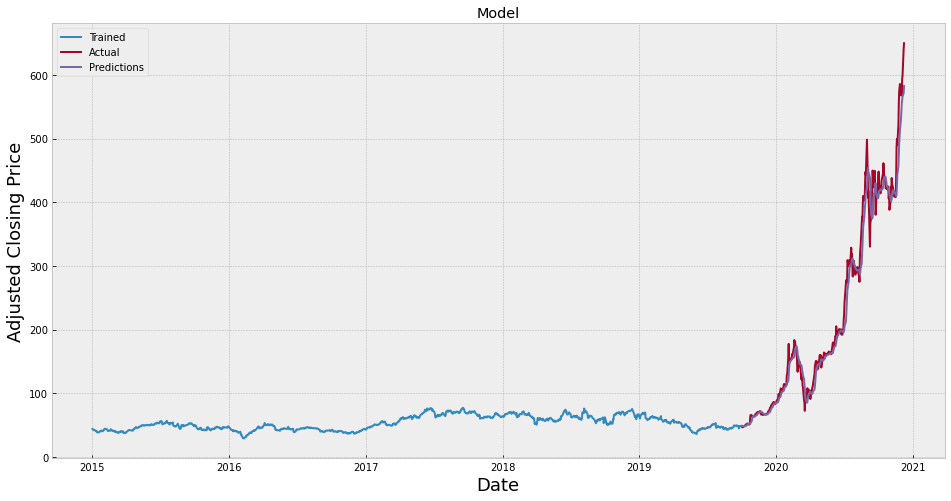

In [31]:
# Plotting the graph

trained = data[:training_length]
actual = data[training_length:]
actual['Predictions'] = predictions

plt.figure(figsize=(16,8))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Adjusted Closing Price', fontsize=18)
plt.plot(trained['Adj Close'])
plt.plot(actual[['Adj Close', 'Predictions']])
plt.legend(['Trained', 'Actual', 'Predictions'], loc='upper left')
plt.show()

In [32]:
# Applying the model to predict a price into the future 

# Retreiving the data via Yahoo Finance and filtering to include jut Adjusted Closing Prices 

TSLA_price_1 = pdr.get_data_yahoo('TSLA', start='2012-01-01', end='2020-12-08')

# TSLA_price_1 = pd.read_csv("TSLA_price_1.csv").set_index("Date")
# TSLA_price_1.head()

TSLA_price_1 = TSLA_price_1.filter(['Adj Close'])

# Storing the last 30 days prices

last30 = TSLA_price_1[-30:].values

# Scaling the last 30 days prices 

last30_scaled = scaler.transform(last30)

# Storing the last 30 days prices into Xtest

Xtest = []
Xtest.append(last30_scaled)
Xtest = np.array(Xtest)
Xtest = np.reshape(Xtest, (Xtest.shape[0], Xtest.shape[1], 1))

# Applying the model to predict the price of the 31st day and printing the same 

predictedprice = model.predict(Xtest)
predictedprice = scaler.inverse_transform(predictedprice)
print(predictedprice)

[[595.56775]]


In [33]:
# Checking whether the predicted price is close to the actual price 

TSLA_price_2 = pdr.get_data_yahoo('TSLA', start='2020-12-09', end='2020-12-09')

# TSLA_price_2 = pd.read_csv("TSLA_price_2.csv").set_index("Date")
# TSLA_price_2.head()

print(TSLA_price_2['Adj Close'])

Date
2020-12-09    604.47998
Name: Adj Close, dtype: float64


## 5. CONCLUSION

To conclude, it can be stated that Tesla is a high risk and high rewarding stock as of today. Therefore, Tesla has often been labeled as one of the most dangerous stocks. However, despite the same, the company attracts a large number of investors. Tesla's innovative cars, disruptive technologies and passion for sustainability has found a huge fan base in millenial investors. Besides, to most millenials, Tesla's appeal lies in the company's ability to benefit the human life through self-driving cars, space exploration, and other developments. As stated often in the media and by many, Tesla is not just a car brand but a lifestyle. 

## 6. LEARNING PROCESS

The learning process has been both challenging and interesting. Through this project, I got the opportunity to visualize time series data more effectively. Also, I was able to dive deeper into data mining through the application of machine learning models such as neural networks. 